# Air Pollution Index Prediction

## Importing Primary Libraries

In [85]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style("darkgrid")
import pickle
import warnings
warnings.filterwarnings("ignore")
import plotly.express as px
import plotly.io as pio
import pandas_profiling as pp

In [86]:
df = pd.read_csv("train.csv")
df

,date_time,is_holiday,humidity,wind_speed,wind_direction,visibility_in_miles,dew_point,temperature,rain_p_h,snow_p_h,clouds_all,weather_type,air_pollution_index,traffic_volume
0,2012-10-02 09:00:00,None,89,2,329,1,1,288.28,0.0,0.0,40,Clouds,121,5545
1,2012-10-02 10:00:00,None,67,3,330,1,1,289.36,0.0,0.0,75,Clouds,178,4516
2,2012-10-02 11:00:00,None,66,3,329,2,2,289.58,0.0,0.0,90,Clouds,113,4767
3,2012-10-02 12:00:00,None,66,3,329,5,5,290.13,0.0,0.0,90,Clouds,20,5026
4,2012-10-02 13:00:00,None,65,3,329,7,7,291.14,0.0,0.0,75,Clouds,281,4918
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
33745,2017-05-17 21:00:00,None,85,1,328,7,7,287.88,0.0,0.0,90,Mist,74,2348
33746,2017-05-17 22:00:00,None,70,1,24,2,2,286.95,0.0,0.0,90,Rain,81,2194
33747,2017-05-17 22:00:00,None,70,1,24,1,1,286.95,0.0,0.0,90,Mist,138,2194
33748,2017-05-17 23:00:00,None,66,1,42,6,6,285.75,0.0,0.0,90,Rain,229,1328


In [87]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33750 entries, 0 to 33749
Data columns (total 14 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   date_time            33750 non-null  object 
 1   is_holiday           33750 non-null  object 
 2   humidity             33750 non-null  int64  
 3   wind_speed           33750 non-null  int64  
 4   wind_direction       33750 non-null  int64  
 5   visibility_in_miles  33750 non-null  int64  
 6   dew_point            33750 non-null  int64  
 7   temperature          33750 non-null  float64
 8   rain_p_h             33750 non-null  float64
 9   snow_p_h             33750 non-null  float64
 10  clouds_all           33750 non-null  int64  
 11  weather_type         33750 non-null  object 
 12  air_pollution_index  33750 non-null  int64  
 13  traffic_volume       33750 non-null  int64  
dtypes: float64(3), int64(8), object(3)
memory usage: 3.6+ MB


In [88]:
round(df.isna().sum() * 100 / len(df) , 2).sort_values(ascending = False)

date_time              0.0
is_holiday             0.0
humidity               0.0
wind_speed             0.0
wind_direction         0.0
visibility_in_miles    0.0
dew_point              0.0
temperature            0.0
rain_p_h               0.0
snow_p_h               0.0
clouds_all             0.0
weather_type           0.0
air_pollution_index    0.0
traffic_volume         0.0
dtype: float64

In [89]:
pp.ProfileReport(df)

Summarize dataset:   0%|          | 0/27 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [90]:
tt = pd.read_csv("test.csv")
ids = tt["date_time"]
tt.head()

,date_time,is_holiday,humidity,wind_speed,wind_direction,visibility_in_miles,dew_point,temperature,rain_p_h,snow_p_h,clouds_all,weather_type,traffic_volume
0,2017-05-18 00:00:00,None,63,1,27,4,4,285.15,0.0,0,90,Rain,646
1,2017-05-18 00:00:00,None,63,1,27,4,4,285.15,0.0,0,90,Mist,646
2,2017-05-18 00:00:00,None,56,1,0,1,1,285.15,0.0,0,90,Drizzle,646
3,2017-05-18 01:00:00,None,56,1,351,2,2,284.79,0.0,0,90,Rain,353
4,2017-05-18 01:00:00,None,56,1,351,1,1,284.79,0.0,0,90,Mist,353


In [91]:
tt.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14454 entries, 0 to 14453
Data columns (total 13 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   date_time            14454 non-null  object 
 1   is_holiday           14454 non-null  object 
 2   humidity             14454 non-null  int64  
 3   wind_speed           14454 non-null  int64  
 4   wind_direction       14454 non-null  int64  
 5   visibility_in_miles  14454 non-null  int64  
 6   dew_point            14454 non-null  int64  
 7   temperature          14454 non-null  float64
 8   rain_p_h             14454 non-null  float64
 9   snow_p_h             14454 non-null  int64  
 10  clouds_all           14454 non-null  int64  
 11  weather_type         14454 non-null  object 
 12  traffic_volume       14454 non-null  int64  
dtypes: float64(2), int64(8), object(3)
memory usage: 1.4+ MB


In [92]:
round(tt.isna().sum() * 100 / len(tt) , 2).sort_values(ascending = False)

date_time              0.0
is_holiday             0.0
humidity               0.0
wind_speed             0.0
wind_direction         0.0
visibility_in_miles    0.0
dew_point              0.0
temperature            0.0
rain_p_h               0.0
snow_p_h               0.0
clouds_all             0.0
weather_type           0.0
traffic_volume         0.0
dtype: float64

In [93]:
df["date_time"] = pd.to_datetime(df["date_time"])
tt["date_time"] = pd.to_datetime(tt["date_time"])

In [94]:
df["date"] = df["date_time"].dt.day
df["month"] = df["date_time"].dt.month
df["year"] = df["date_time"].dt.year
df["hour"] = df["date_time"].dt.hour
df["weekend"] = (df["date_time"].dt.weekday >= 5).astype(int)

In [95]:
tt["date"] = tt["date_time"].dt.day
tt["month"] = tt["date_time"].dt.month
tt["year"] = tt["date_time"].dt.year
tt["hour"] = tt["date_time"].dt.hour
tt["weekend"] = (tt["date_time"].dt.weekday >= 5).astype(int)

In [96]:
ids = tt["date_time"]

df.drop(["date_time"] , axis = 1 , inplace = True)
tt.drop(["date_time"] , axis = 1 , inplace = True)

In [97]:
cats = df.select_dtypes(include = "object").columns.tolist()
cats

['is_holiday', 'weather_type']

In [98]:
ints = df.select_dtypes(exclude = "object").columns.tolist()
ints.remove("air_pollution_index")
ints

['humidity',
 'wind_speed',
 'wind_direction',
 'visibility_in_miles',
 'dew_point',
 'temperature',
 'rain_p_h',
 'snow_p_h',
 'clouds_all',
 'traffic_volume',
 'date',
 'month',
 'year',
 'hour',
 'weekend']

## Basic Preprocessing and EDA

<AxesSubplot:ylabel='None'>

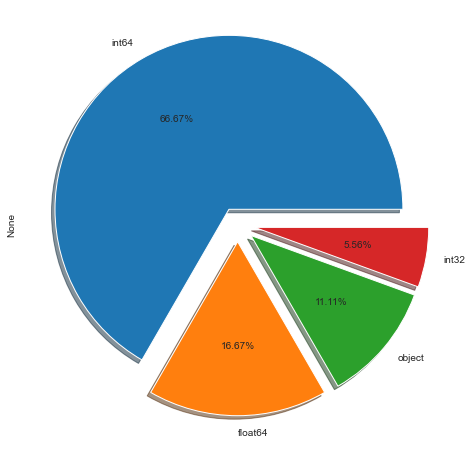

In [99]:
plt.figure(figsize = (15 , 8))
df.dtypes.value_counts().plot.pie(explode=[0.1 , 0.1 , 0.1 , 0.1] , autopct='%1.2f%%' , shadow=True)

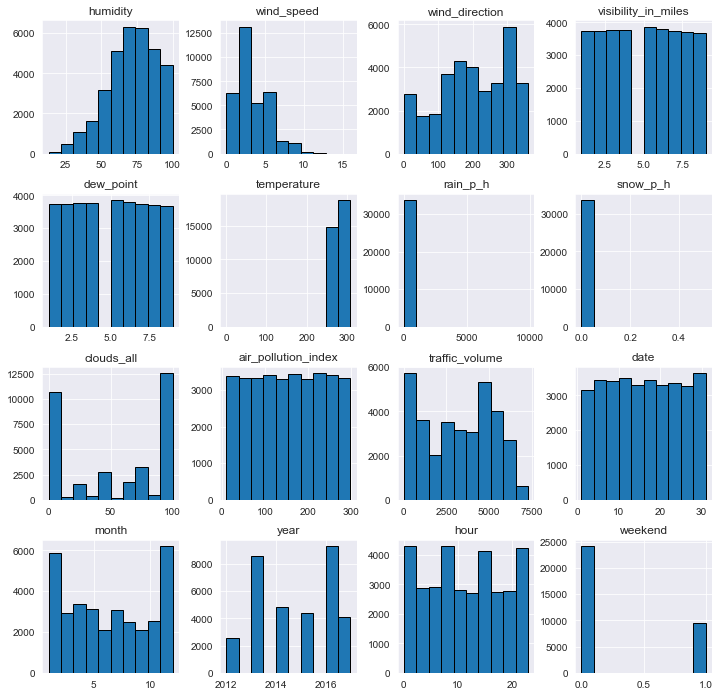

In [100]:
df.hist(edgecolor='black',figsize=(12,12));

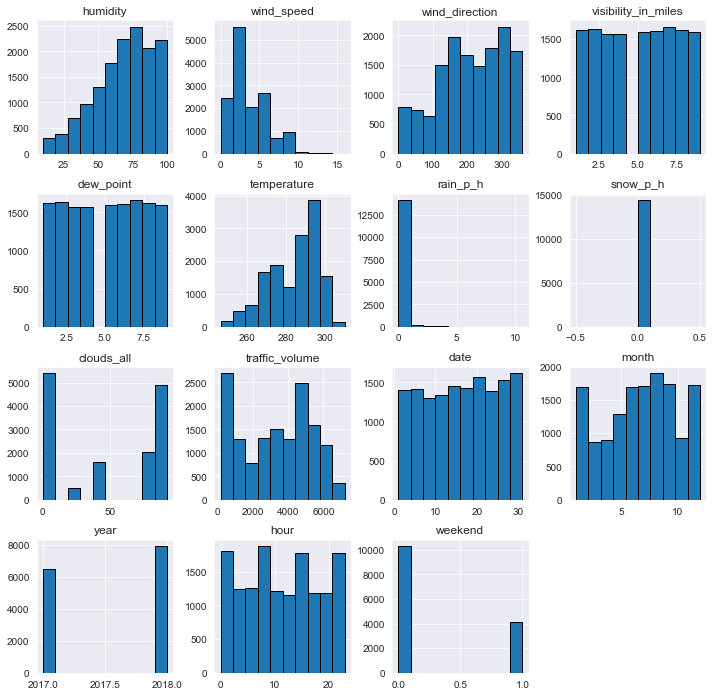

In [101]:
tt.hist(edgecolor='black',figsize=(12,12));

The number of unique values in is_holiday column is/are : 12


The unique values in is_holiday column is/are : ['None' 'Columbus Day' 'Veterans Day' 'Thanksgiving Day' 'Christmas Day'
 'New Years Day' 'Washingtons Birthday' 'Memorial Day' 'Independence Day'
 'State Fair' 'Labor Day' 'Martin Luther King Jr Day']


The number of missing values are : 0 and the percentage of 0.0 %


The value counts for each value in is_holiday column is/are :  
None                         33707
Thanksgiving Day                 5
Christmas Day                    5
New Years Day                    5
Veterans Day                     4
Columbus Day                     4
Washingtons Birthday             4
Labor Day                        4
Memorial Day                     3
State Fair                       3
Independence Day                 3
Martin Luther King Jr Day        3
Name: is_holiday, dtype: int64





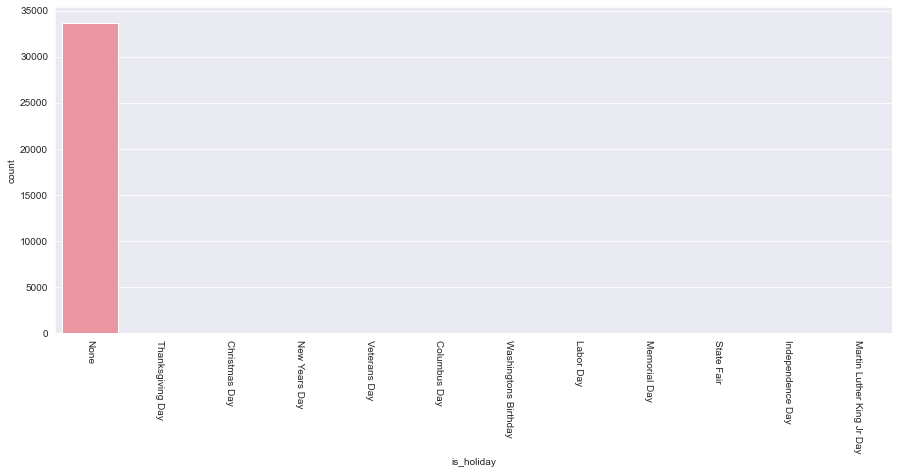

****************************************************************************************************



The number of unique values in weather_type column is/are : 11


The unique values in weather_type column is/are : ['Clouds' 'Clear' 'Rain' 'Drizzle' 'Mist' 'Haze' 'Fog' 'Thunderstorm'
 'Snow' 'Squall' 'Smoke']


The number of missing values are : 0 and the percentage of 0.0 %


The value counts for each value in weather_type column is/are :  
Clouds          11213
Clear            9233
Mist             4047
Rain             3940
Snow             2070
Drizzle          1204
Haze              902
Fog               567
Thunderstorm      553
Smoke              17
Squall              4
Name: weather_type, dtype: int64





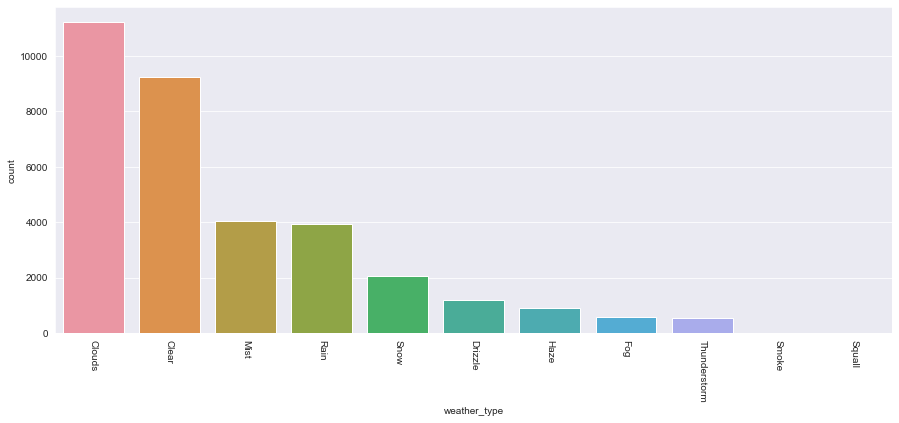

****************************************************************************************************





In [102]:
for i in cats:
    print(f"The number of unique values in {i} column is/are : {len(df[i].unique())}")
    print("\n")
    print(f"The unique values in {i} column is/are : {df[i].unique()}")
    print("\n")
    print(f"The number of missing values are : {df[i].isna().sum()} and the percentage of {df[i].isna().sum() * 100 / len(df)} %")
    print("\n")
    print(f"The value counts for each value in {i} column is/are :  \n{df[i].value_counts()}")
    print("\n\n")
    plt.figure(figsize = (15 , 6))
    sns.countplot(data = df , x = i , order = df[i].value_counts().index)
    plt.xticks(rotation = -90)
    plt.show()
    print("*"*100)
    print("\n\n")

The number of unique values in is_holiday column is/are : 12


The unique values in is_holiday column is/are : ['None' 'Memorial Day' 'Independence Day' 'State Fair' 'Labor Day'
 'Columbus Day' 'Veterans Day' 'Thanksgiving Day' 'Christmas Day'
 'New Years Day' 'Martin Luther King Jr Day' 'Washingtons Birthday']


The number of missing values are : 0 and the percentage of 0.0 %


The value counts for each value in is_holiday column is/are :  
None                         14436
Labor Day                        3
Martin Luther King Jr Day        3
Independence Day                 2
Memorial Day                     2
State Fair                       2
Thanksgiving Day                 1
Christmas Day                    1
Columbus Day                     1
Washingtons Birthday             1
New Years Day                    1
Veterans Day                     1
Name: is_holiday, dtype: int64





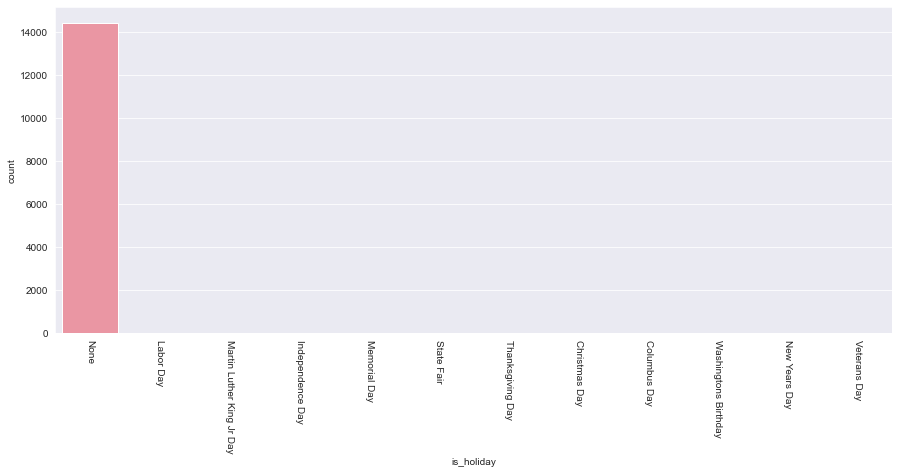

****************************************************************************************************



The number of unique values in weather_type column is/are : 10


The unique values in weather_type column is/are : ['Rain' 'Mist' 'Drizzle' 'Clouds' 'Clear' 'Haze' 'Fog' 'Thunderstorm'
 'Smoke' 'Snow']


The number of missing values are : 0 and the percentage of 0.0 %


The value counts for each value in weather_type column is/are :  
Clear           4158
Clouds          3951
Mist            1903
Rain            1732
Snow             806
Drizzle          617
Thunderstorm     481
Haze             458
Fog              345
Smoke              3
Name: weather_type, dtype: int64





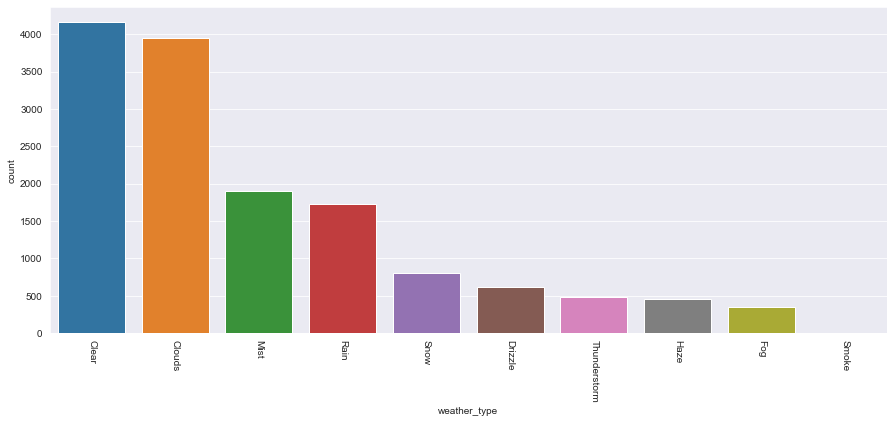

****************************************************************************************************





In [103]:
for i in cats:
    print(f"The number of unique values in {i} column is/are : {len(tt[i].unique())}")
    print("\n")
    print(f"The unique values in {i} column is/are : {tt[i].unique()}")
    print("\n")
    print(f"The number of missing values are : {tt[i].isna().sum()} and the percentage of {tt[i].isna().sum() * 100 / len(tt)} %")
    print("\n")
    print(f"The value counts for each value in {i} column is/are :  \n{tt[i].value_counts()}")
    print("\n\n")
    plt.figure(figsize = (15 , 6))
    sns.countplot(data = tt , x = i , order = tt[i].value_counts().index)
    plt.xticks(rotation = -90)
    plt.show()
    print("*"*100)
    print("\n\n")

In [104]:
df["is_holiday"].loc[df["is_holiday"] != "None"]

126                   Columbus Day
1123                  Veterans Day
1370              Thanksgiving Day
2360                 Christmas Day
2559                 New Years Day
3697          Washingtons Birthday
6430                  Memorial Day
7414              Independence Day
8575                    State Fair
8742                     Labor Day
9455                  Columbus Day
9768                  Veterans Day
10181             Thanksgiving Day
10939                Christmas Day
11132                New Years Day
11611    Martin Luther King Jr Day
12303         Washingtons Birthday
14645                 Memorial Day
16204             Independence Day
17750                   State Fair
18041                    Labor Day
18946                 Columbus Day
19410                 Veterans Day
19675             Thanksgiving Day
19676             Thanksgiving Day
20185                Christmas Day
20344                New Years Day
20345                New Years Day
21294         Washin

In [105]:
df["is_holiday"].loc[df["is_holiday"] != "None"] = "Holiday"
tt["is_holiday"].loc[tt["is_holiday"] != "None"] = "Holiday"

In [106]:
df["weather_type"].loc[df["weather_type"].isin(["Smoke" , "Squall"])]

5958     Squall
7132     Squall
8261     Squall
16330     Smoke
16335     Smoke
16339     Smoke
16343     Smoke
16346     Smoke
16348     Smoke
16350     Smoke
16352     Smoke
23091     Smoke
23093     Smoke
23095     Smoke
23097     Smoke
23099     Smoke
23101     Smoke
23103     Smoke
23105     Smoke
23107     Smoke
25287    Squall
Name: weather_type, dtype: object

In [107]:
df["weather_type"].loc[df["weather_type"].isin(["Smoke" , "Squall"])] = "Smoke"
tt["weather_type"].loc[tt["weather_type"].isin(["Smoke" , "Squall"])] = "Smoke"

The number of unique values in is_holiday column is/are : 2


The unique values in is_holiday column is/are : ['None' 'Holiday']


The number of missing values are : 0 and the percentage of 0.0 %


The value counts for each value in is_holiday column is/are :  
None       33707
Holiday       43
Name: is_holiday, dtype: int64





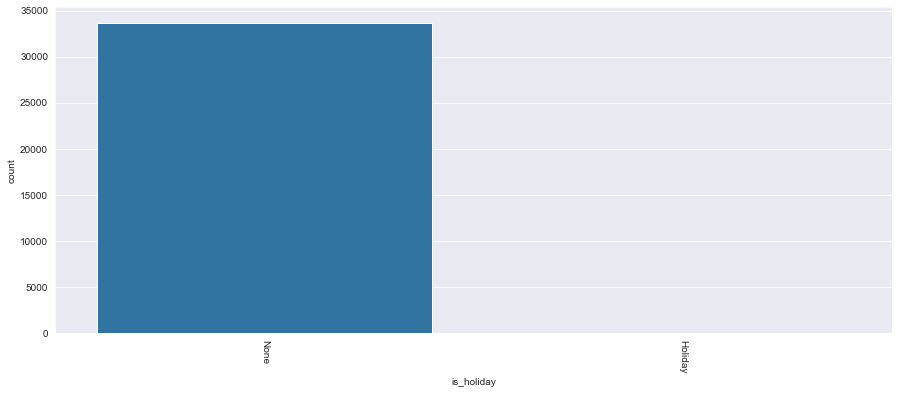

****************************************************************************************************



The number of unique values in weather_type column is/are : 10


The unique values in weather_type column is/are : ['Clouds' 'Clear' 'Rain' 'Drizzle' 'Mist' 'Haze' 'Fog' 'Thunderstorm'
 'Snow' 'Smoke']


The number of missing values are : 0 and the percentage of 0.0 %


The value counts for each value in weather_type column is/are :  
Clouds          11213
Clear            9233
Mist             4047
Rain             3940
Snow             2070
Drizzle          1204
Haze              902
Fog               567
Thunderstorm      553
Smoke              21
Name: weather_type, dtype: int64





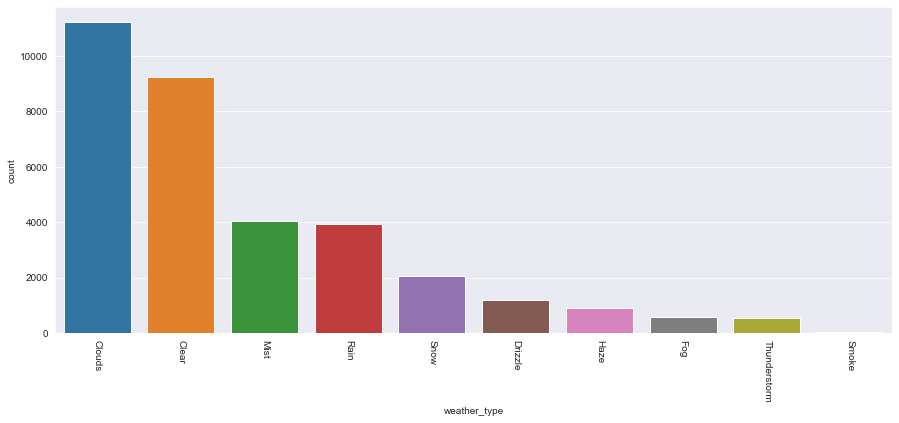

****************************************************************************************************





In [108]:
for i in cats:
    print(f"The number of unique values in {i} column is/are : {len(df[i].unique())}")
    print("\n")
    print(f"The unique values in {i} column is/are : {df[i].unique()}")
    print("\n")
    print(f"The number of missing values are : {df[i].isna().sum()} and the percentage of {df[i].isna().sum() * 100 / len(df)} %")
    print("\n")
    print(f"The value counts for each value in {i} column is/are :  \n{df[i].value_counts()}")
    print("\n\n")
    plt.figure(figsize = (15 , 6))
    sns.countplot(data = df , x = i , order = df[i].value_counts().index)
    plt.xticks(rotation = -90)
    plt.show()
    print("*"*100)
    print("\n\n")

The number of unique values in is_holiday column is/are : 2


The unique values in is_holiday column is/are : ['None' 'Holiday']


The number of missing values are : 0 and the percentage of 0.0 %


The value counts for each value in is_holiday column is/are :  
None       14436
Holiday       18
Name: is_holiday, dtype: int64





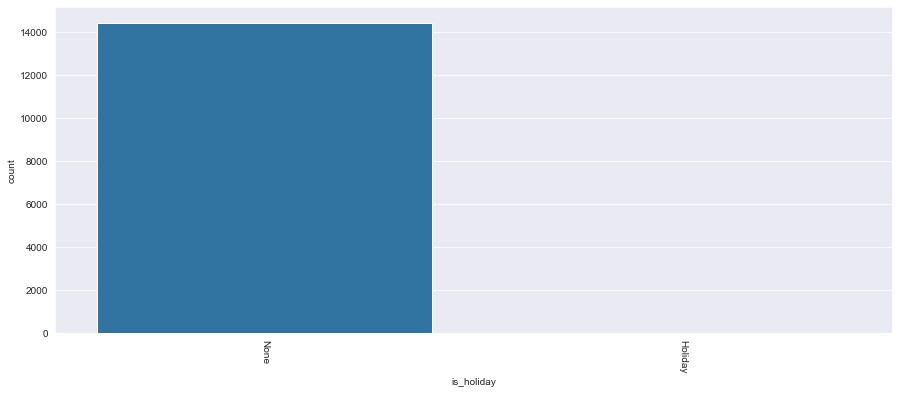

****************************************************************************************************



The number of unique values in weather_type column is/are : 10


The unique values in weather_type column is/are : ['Rain' 'Mist' 'Drizzle' 'Clouds' 'Clear' 'Haze' 'Fog' 'Thunderstorm'
 'Smoke' 'Snow']


The number of missing values are : 0 and the percentage of 0.0 %


The value counts for each value in weather_type column is/are :  
Clear           4158
Clouds          3951
Mist            1903
Rain            1732
Snow             806
Drizzle          617
Thunderstorm     481
Haze             458
Fog              345
Smoke              3
Name: weather_type, dtype: int64





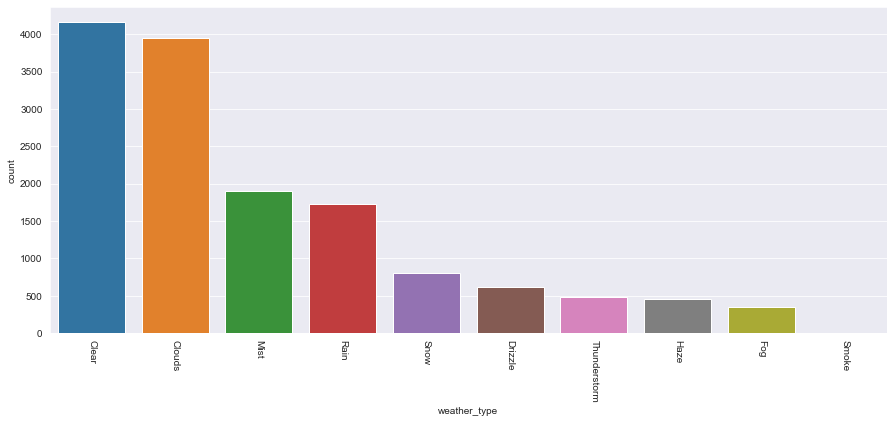

****************************************************************************************************





In [109]:
for i in cats:
    print(f"The number of unique values in {i} column is/are : {len(tt[i].unique())}")
    print("\n")
    print(f"The unique values in {i} column is/are : {tt[i].unique()}")
    print("\n")
    print(f"The number of missing values are : {tt[i].isna().sum()} and the percentage of {tt[i].isna().sum() * 100 / len(tt)} %")
    print("\n")
    print(f"The value counts for each value in {i} column is/are :  \n{tt[i].value_counts()}")
    print("\n\n")
    plt.figure(figsize = (15 , 6))
    sns.countplot(data = tt , x = i , order = tt[i].value_counts().index)
    plt.xticks(rotation = -90)
    plt.show()
    print("*"*100)
    print("\n\n")

In [110]:
df.describe()

,humidity,wind_speed,wind_direction,visibility_in_miles,dew_point,temperature,rain_p_h,snow_p_h,clouds_all,air_pollution_index,traffic_volume,date,month,year,hour,weekend
count,33750.000000,33750.000000,33750.000000,33750.000000,33750.000000,33750.000000,33750.000000,33750.000000,33750.000000,33750.000000,33750.000000,33750.000000,33750.000000,33750.000000,33750.000000,33750.000000
mean,71.209007,3.378193,199.471852,4.989748,4.989748,280.069587,0.448739,0.000318,50.458785,154.841422,3240.118163,15.646874,6.407674,2014.639822,11.404385,0.283200
std,16.852248,2.055792,99.841088,2.570021,2.570021,13.415256,53.526500,0.009760,38.871734,83.735515,1991.487289,8.700568,3.543241,1.572845,6.951078,0.450559
min,13.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,10.000000,0.000000,1.000000,1.000000,2012.000000,0.000000,0.000000
25%,60.000000,2.000000,130.000000,3.000000,3.000000,271.720000,0.000000,0.000000,1.000000,83.000000,1165.250000,8.000000,3.000000,2013.000000,5.000000,0.000000
50%,72.000000,3.000000,200.000000,5.000000,5.000000,280.150000,0.000000,0.000000,64.000000,155.000000,3335.000000,16.000000,6.000000,2015.000000,11.000000,0.000000
75%,85.000000,5.000000,290.000000,7.000000,7.000000,290.620000,0.000000,0.000000,90.000000,228.000000,4926.000000,23.000000,10.000000,2016.000000,17.000000,1.000000
max,100.000000,16.000000,360.000000,9.000000,9.000000,308.240000,9831.300000,0.510000,100.000000,299.000000,7280.000000,31.000000,12.000000,2017.000000,23.000000,1.000000


<AxesSubplot:>

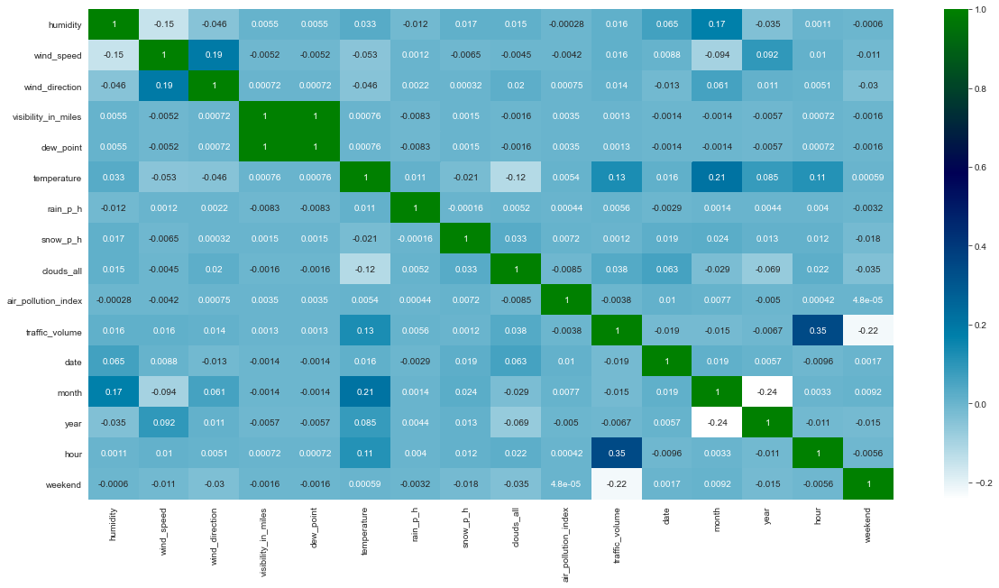

In [111]:
plt.figure(figsize = (20 , 10))
sns.heatmap(df.corr() , annot = True , cmap = "ocean_r")

In [112]:
df.drop(["visibility_in_miles"] , axis = 1 , inplace = True)
tt.drop(["visibility_in_miles"] , axis = 1 , inplace = True)

## Outliers Treatment

* Skewness in the range of [-3 , 3]
* Kurtosis in the range of [-1 , 10]

In [113]:
skew = df.skew()
skew

humidity                -0.463709
wind_speed               0.732442
wind_direction          -0.294430
dew_point                0.003257
temperature             -2.903702
rain_p_h               183.582818
snow_p_h                40.462006
clouds_all              -0.246849
air_pollution_index     -0.009921
traffic_volume          -0.071139
date                     0.027890
month                    0.087253
year                    -0.065644
hour                     0.028676
weekend                  0.962416
dtype: float64

rain_p_h with skewness of    183.5828175125863


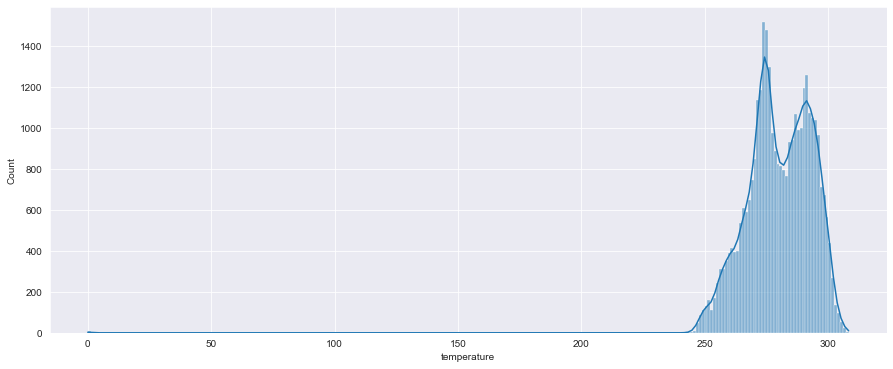

snow_p_h with skewness of    40.46200645620132


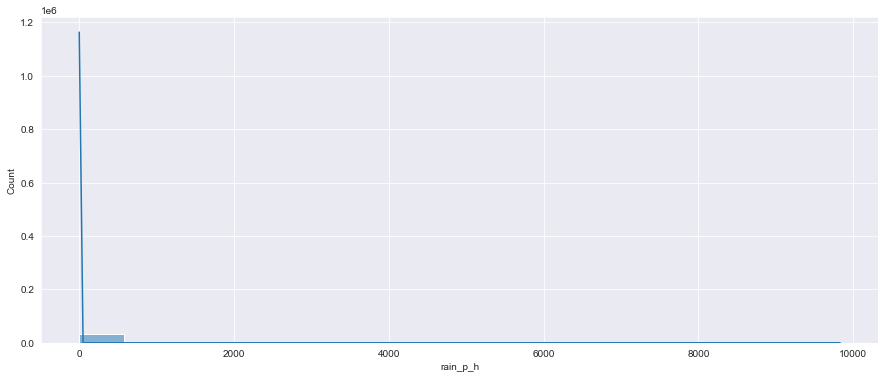

Wall time: 1.83 s


In [114]:
%%time

for i in range(len(skew)):
    if skew[i] > 3 or skew[i] < -3:
        print(f"{skew.index[i]} with skewness of {skew[i] : >{20}}")
        plt.figure(figsize = (15 , 6))
        sns.histplot(data = df , x = df.columns[i] , kde = True)
        plt.show()

In [115]:
kurtosis = df.kurtosis()
kurtosis

humidity                  -0.225288
wind_speed                 0.515844
wind_direction            -0.935087
dew_point                 -1.216510
temperature               55.084119
rain_p_h               33718.384947
snow_p_h                1833.486233
clouds_all                -1.710907
air_pollution_index       -1.199908
traffic_volume            -1.315953
date                      -1.178238
month                     -1.249837
year                      -1.323686
hour                      -1.212490
weekend                   -1.073819
dtype: float64

temperature with kurtosis of    55.08411866886922


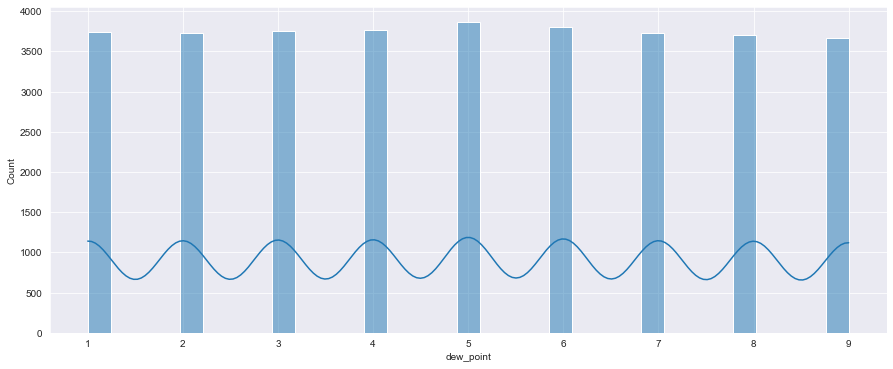

rain_p_h with kurtosis of     33718.3849473147


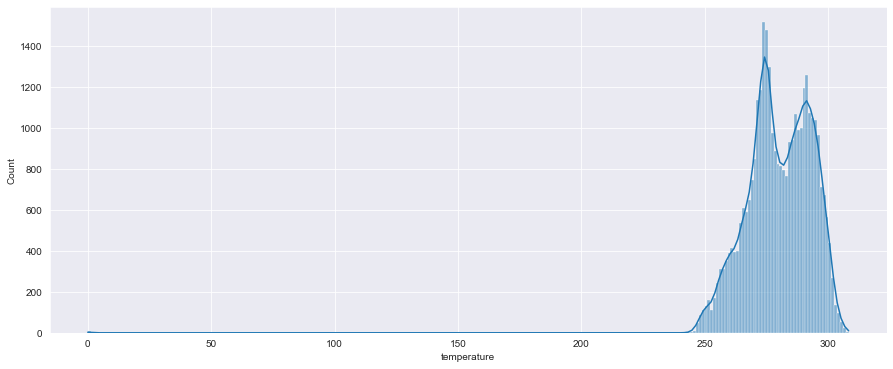

snow_p_h with kurtosis of   1833.4862327725707


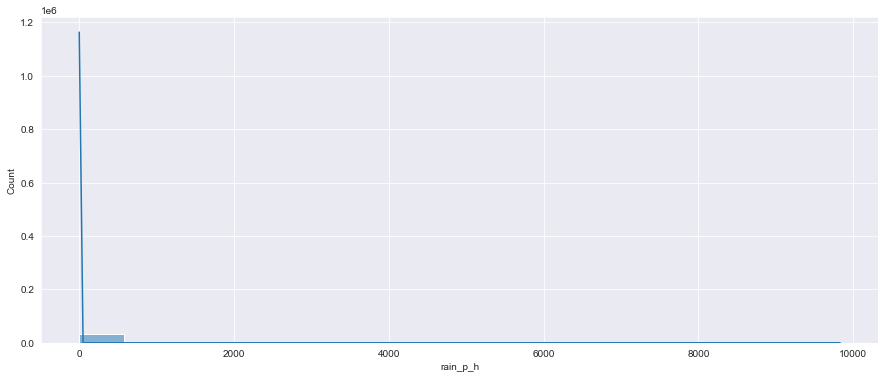

Wall time: 2.04 s


In [116]:
%%time

for i in range(len(kurtosis)):
    if kurtosis[i] > 10 or kurtosis[i] < -10:
        print(f"{kurtosis.index[i]} with kurtosis of {kurtosis[i] : >{20}}")
        plt.figure(figsize = (15 , 6))
        sns.histplot(data = df , x = df.columns[i] , kde = True)
        plt.show()

In [117]:
df_temp = df.copy()

In [118]:
# Percentile Cutoff method

outs = ["rain_p_h" , "snow_p_h" , "temperature"]

for i in outs:
    df[i].loc[df[i] < np.percentile(df[i] , [1])[0] * 0.3] = np.percentile(df[i] , [1])[0]
    df[i].loc[df[i] > np.percentile(df[i] , [99])[0] * 3] = np.percentile(df[i] , [99])[0]

In [119]:
# Exponential Smothening

for i in outs:
    df[i] = np.log(df[i] + 1)
    tt[i] = np.log(tt[i] + 1)

### Rechecking for outliers after the Treatment

In [120]:
skew = df.skew()
skew

humidity              -0.463709
wind_speed             0.732442
wind_direction        -0.294430
dew_point              0.003257
temperature           -0.364997
rain_p_h               5.707520
snow_p_h               0.000000
clouds_all            -0.246849
air_pollution_index   -0.009921
traffic_volume        -0.071139
date                   0.027890
month                  0.087253
year                  -0.065644
hour                   0.028676
weekend                0.962416
dtype: float64

rain_p_h with skewness of   5.7075201380288085


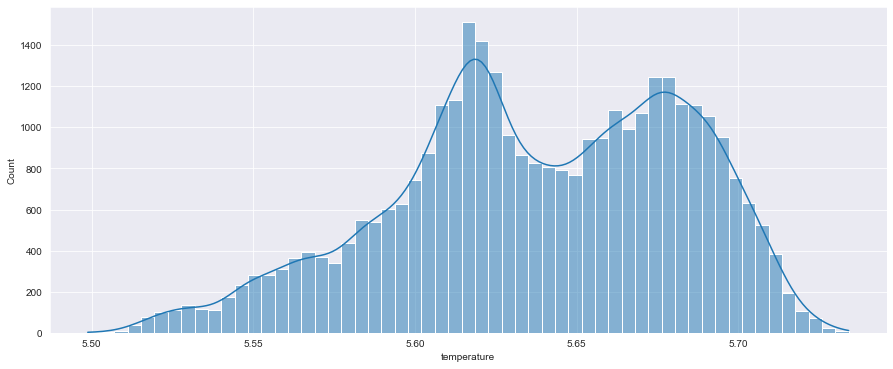

Wall time: 460 ms


In [121]:
%%time

for i in range(len(skew)):
    if skew[i] > 3 or skew[i] < -3:
        print(f"{skew.index[i]} with skewness of {skew[i] : >{20}}")
        plt.figure(figsize = (15 , 6))
        sns.histplot(data = df , x = df.columns[i] , kde = True)
        plt.show()

In [122]:
kurtosis = df.kurtosis()
kurtosis

humidity               -0.225288
wind_speed              0.515844
wind_direction         -0.935087
dew_point              -1.216510
temperature            -0.528825
rain_p_h               36.091376
snow_p_h                0.000000
clouds_all             -1.710907
air_pollution_index    -1.199908
traffic_volume         -1.315953
date                   -1.178238
month                  -1.249837
year                   -1.323686
hour                   -1.212490
weekend                -1.073819
dtype: float64

rain_p_h with kurtosis of   36.091375805496305


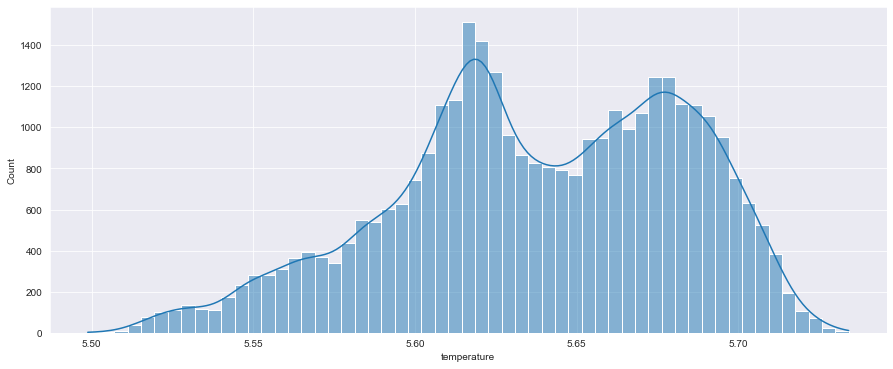

Wall time: 406 ms


In [123]:
%%time

for i in range(len(kurtosis)):
    if kurtosis[i] > 10 or kurtosis[i] < -10:
        print(f"{kurtosis.index[i]} with kurtosis of {kurtosis[i] : >{20}}")
        plt.figure(figsize = (15 , 6))
        sns.histplot(data = df , x = df.columns[i] , kde = True)
        plt.show()

We removed most of the outliers

In [124]:
df.describe()

,humidity,wind_speed,wind_direction,dew_point,temperature,rain_p_h,snow_p_h,clouds_all,air_pollution_index,traffic_volume,date,month,year,hour,weekend
count,33750.000000,33750.000000,33750.000000,33750.000000,33750.000000,33750.000000,33750.0,33750.000000,33750.000000,33750.000000,33750.000000,33750.000000,33750.000000,33750.000000,33750.000000
mean,71.209007,3.378193,199.471852,4.989748,5.637863,0.060067,0.0,50.458785,154.841422,3240.118163,15.646874,6.407674,2014.639822,11.404385,0.283200
std,16.852248,2.055792,99.841088,2.570021,0.044927,0.263292,0.0,38.871734,83.735515,1991.487289,8.700568,3.543241,1.572845,6.951078,0.450559
min,13.000000,0.000000,0.000000,1.000000,5.498765,0.000000,0.0,0.000000,10.000000,0.000000,1.000000,1.000000,2012.000000,0.000000,0.000000
25%,60.000000,2.000000,130.000000,3.000000,5.608446,0.000000,0.0,1.000000,83.000000,1165.250000,8.000000,3.000000,2013.000000,5.000000,0.000000
50%,72.000000,3.000000,200.000000,5.000000,5.638888,0.000000,0.0,64.000000,155.000000,3335.000000,16.000000,6.000000,2015.000000,11.000000,0.000000
75%,85.000000,5.000000,290.000000,7.000000,5.675452,0.000000,0.0,90.000000,228.000000,4926.000000,23.000000,10.000000,2016.000000,17.000000,1.000000
max,100.000000,16.000000,360.000000,9.000000,5.734118,2.626840,0.0,100.000000,299.000000,7280.000000,31.000000,12.000000,2017.000000,23.000000,1.000000


<AxesSubplot:>

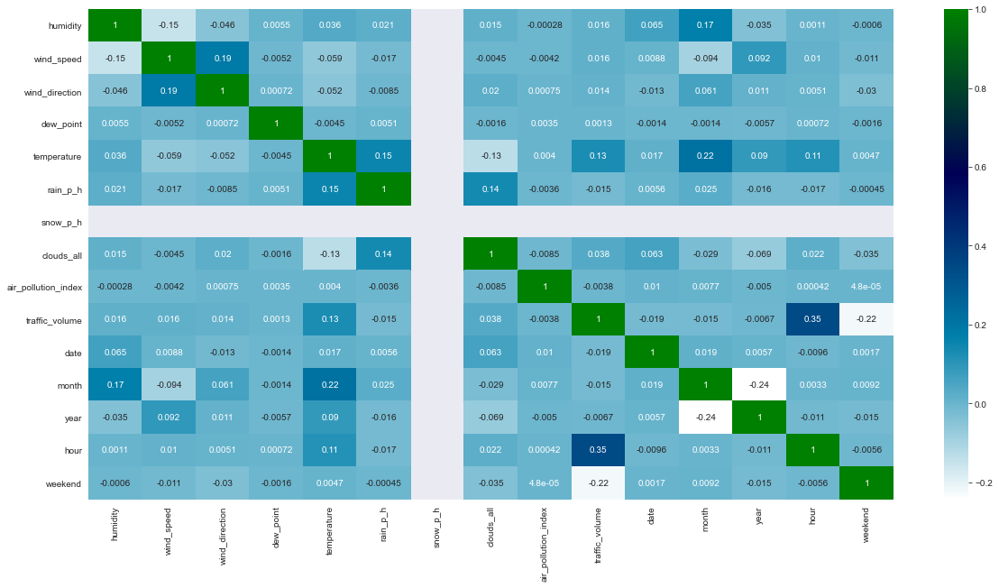

In [125]:
plt.figure(figsize = (20 , 10))
sns.heatmap(df.corr() , annot = True , cmap = "ocean_r")

In [126]:
df_temp["snow_p_h"].value_counts()

0.00    33687
0.05       14
0.06       12
0.51        6
0.13        6
0.25        6
0.10        6
0.32        5
0.17        3
0.08        2
0.44        2
0.21        1
Name: snow_p_h, dtype: int64

In [127]:
df["snow_p_h"].value_counts()

0.0    33750
Name: snow_p_h, dtype: int64

In [128]:
tt["snow_p_h"].value_counts()

0.0    14454
Name: snow_p_h, dtype: int64

In [129]:
df.drop(["snow_p_h"] , axis = 1 , inplace = True)
tt.drop(["snow_p_h"] , axis = 1 , inplace = True)

<AxesSubplot:>

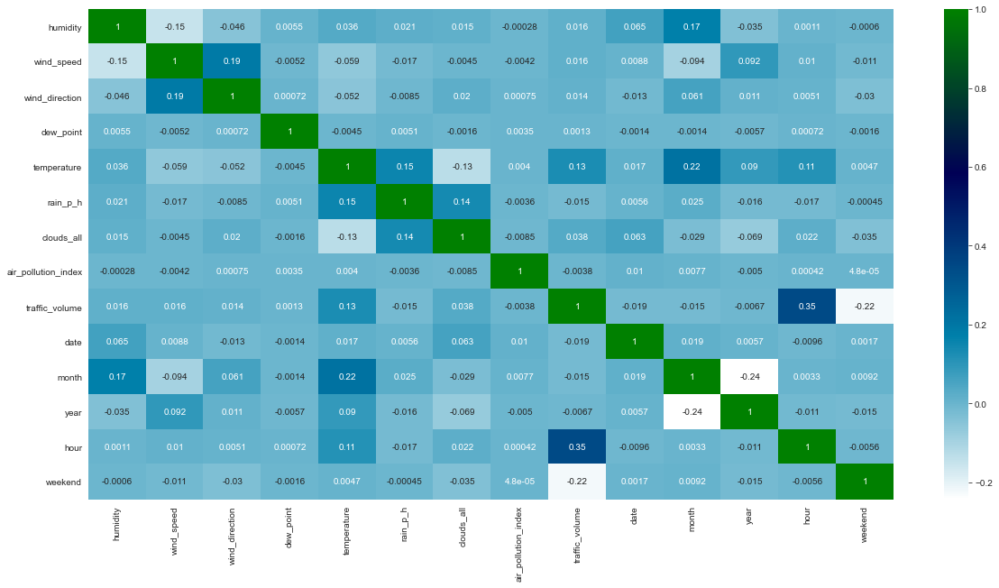

In [130]:
plt.figure(figsize = (20 , 10))
sns.heatmap(df.corr() , annot = True , cmap = "ocean_r")

In [131]:
df["year"].value_counts()

2016    9306
2013    8573
2014    4839
2015    4373
2017    4100
2012    2559
Name: year, dtype: int64

In [132]:
tt["year"].value_counts()

2018    7949
2017    6505
Name: year, dtype: int64

In [133]:
df["year"] = df["year"] - 2011
tt["year"] = tt["year"] - 2011

In [134]:
cats

['is_holiday', 'weather_type']

## Label Encoding and Dummies

In [135]:
from sklearn.preprocessing import LabelEncoder

lb = LabelEncoder()
df[["is_holiday"]] = lb.fit_transform(df[["is_holiday"]])
tt[["is_holiday"]] = lb.transform(tt[["is_holiday"]])

In [136]:
df = pd.get_dummies(df , columns = ["weather_type"] , drop_first = True)
tt = pd.get_dummies(tt , columns = ["weather_type"] , drop_first = True)

In [137]:
df.head()

,is_holiday,humidity,wind_speed,wind_direction,dew_point,temperature,rain_p_h,clouds_all,air_pollution_index,traffic_volume,...,weekend,weather_type_Clouds,weather_type_Drizzle,weather_type_Fog,weather_type_Haze,weather_type_Mist,weather_type_Rain,weather_type_Smoke,weather_type_Snow,weather_type_Thunderstorm
0,1,89,2,329,1,5.667395,0.0,40,121,5545,...,0,1,0,0,0,0,0,0,0,0
1,1,67,3,330,1,5.671122,0.0,75,178,4516,...,0,1,0,0,0,0,0,0,0,0
2,1,66,3,329,2,5.671879,0.0,90,113,4767,...,0,1,0,0,0,0,0,0,0,0
3,1,66,3,329,5,5.673770,0.0,90,20,5026,...,0,1,0,0,0,0,0,0,0,0
4,1,65,3,329,7,5.677233,0.0,75,281,4918,...,0,1,0,0,0,0,0,0,0,0


In [138]:
tt.head()

,is_holiday,humidity,wind_speed,wind_direction,dew_point,temperature,rain_p_h,clouds_all,traffic_volume,date,...,weekend,weather_type_Clouds,weather_type_Drizzle,weather_type_Fog,weather_type_Haze,weather_type_Mist,weather_type_Rain,weather_type_Smoke,weather_type_Snow,weather_type_Thunderstorm
0,1,63,1,27,4,5.656516,0.0,90,646,18,...,0,0,0,0,0,0,1,0,0,0
1,1,63,1,27,4,5.656516,0.0,90,646,18,...,0,0,0,0,0,1,0,0,0,0
2,1,56,1,0,1,5.656516,0.0,90,646,18,...,0,0,1,0,0,0,0,0,0,0
3,1,56,1,351,2,5.655257,0.0,90,353,18,...,0,0,0,0,0,0,1,0,0,0
4,1,56,1,351,1,5.655257,0.0,90,353,18,...,0,0,0,0,0,1,0,0,0,0


### Checking for multicollinearity

In [139]:
from sklearn.feature_selection import mutual_info_classif as mif

mif_values = mif(df.drop(["air_pollution_index"] , axis = 1) , df["air_pollution_index"])

pd.DataFrame(mif_values , index = df.drop(["air_pollution_index"] , axis = 1).columns).sort_values(by = 0 , ascending = False)

,0
weather_type_Smoke,0.006635
weather_type_Haze,0.006224
is_holiday,0.005614
weather_type_Clouds,0.003856
weather_type_Snow,0.003689
month,0.003672
weather_type_Mist,0.003446
dew_point,0.003158
wind_speed,0.002874
weather_type_Drizzle,0.002609


## Pre Evaluation Checking

In [140]:
df.isna().sum()

is_holiday                   0
humidity                     0
wind_speed                   0
wind_direction               0
dew_point                    0
temperature                  0
rain_p_h                     0
clouds_all                   0
air_pollution_index          0
traffic_volume               0
date                         0
month                        0
year                         0
hour                         0
weekend                      0
weather_type_Clouds          0
weather_type_Drizzle         0
weather_type_Fog             0
weather_type_Haze            0
weather_type_Mist            0
weather_type_Rain            0
weather_type_Smoke           0
weather_type_Snow            0
weather_type_Thunderstorm    0
dtype: int64

In [141]:
tt.isna().sum()

is_holiday                   0
humidity                     0
wind_speed                   0
wind_direction               0
dew_point                    0
temperature                  0
rain_p_h                     0
clouds_all                   0
traffic_volume               0
date                         0
month                        0
year                         0
hour                         0
weekend                      0
weather_type_Clouds          0
weather_type_Drizzle         0
weather_type_Fog             0
weather_type_Haze            0
weather_type_Mist            0
weather_type_Rain            0
weather_type_Smoke           0
weather_type_Snow            0
weather_type_Thunderstorm    0
dtype: int64

<AxesSubplot:ylabel='None'>

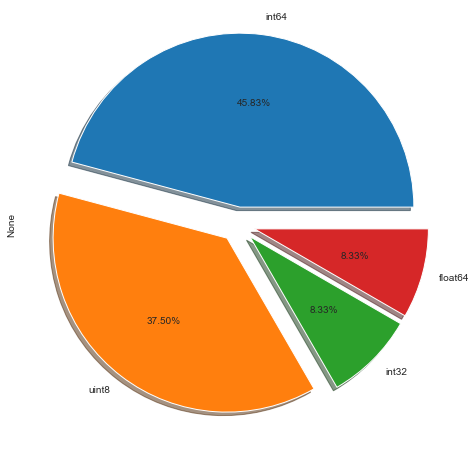

In [142]:
plt.figure(figsize = (15 , 8))
df.dtypes.value_counts().plot.pie(explode=[0.1 , 0.1 , 0.1 , 0.1] , autopct='%1.2f%%' , shadow=True)

##  Train Test Split

In [143]:
X = df.drop(["air_pollution_index"] , axis = 1)
y = df["air_pollution_index"]

In [144]:
from sklearn.model_selection import train_test_split

X_train , X_test , y_train , y_test = train_test_split(X , y , test_size = 0.2 , random_state = 42)
len(X_train) , len(X_test) , len(y_train) , len(y_test)

(27000, 6750, 27000, 6750)

In [145]:
X.head().T

,0,1,2,3,4
is_holiday,1.000000,1.000000,1.000000,1.00000,1.000000
humidity,89.000000,67.000000,66.000000,66.00000,65.000000
wind_speed,2.000000,3.000000,3.000000,3.00000,3.000000
wind_direction,329.000000,330.000000,329.000000,329.00000,329.000000
dew_point,1.000000,1.000000,2.000000,5.00000,7.000000
temperature,5.667395,5.671122,5.671879,5.67377,5.677233
rain_p_h,0.000000,0.000000,0.000000,0.00000,0.000000
clouds_all,40.000000,75.000000,90.000000,90.00000,75.000000
traffic_volume,5545.000000,4516.000000,4767.000000,5026.00000,4918.000000
date,2.000000,2.000000,2.000000,2.00000,2.000000


In [146]:
ints

['humidity',
 'wind_speed',
 'wind_direction',
 'visibility_in_miles',
 'dew_point',
 'temperature',
 'rain_p_h',
 'snow_p_h',
 'clouds_all',
 'traffic_volume',
 'date',
 'month',
 'year',
 'hour',
 'weekend']

In [147]:
for i in ["visibility_in_miles" , "snow_p_h" , "weekend"]:
    ints.remove(i)
    
ints

['humidity',
 'wind_speed',
 'wind_direction',
 'dew_point',
 'temperature',
 'rain_p_h',
 'clouds_all',
 'traffic_volume',
 'date',
 'month',
 'year',
 'hour']

## Feature Scaling

In [148]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()


X_train[ints] = scaler.fit_transform(X_train[ints])
X_test[ints] = scaler.transform(X_test[ints])
tt[ints] = scaler.transform(tt[ints])

In [149]:
X_train.head()

,is_holiday,humidity,wind_speed,wind_direction,dew_point,temperature,rain_p_h,clouds_all,traffic_volume,date,...,weekend,weather_type_Clouds,weather_type_Drizzle,weather_type_Fog,weather_type_Haze,weather_type_Mist,weather_type_Rain,weather_type_Smoke,weather_type_Snow,weather_type_Thunderstorm
28497,1,-0.187008,0.786528,0.709170,0.780402,-0.037647,-0.227063,-1.174815,0.368489,1.189072,...,1,0,0,0,0,0,0,0,0,0
12114,1,0.405033,-0.670072,-0.392075,0.391304,-1.953894,-0.227063,0.626537,-1.476003,-0.766211,...,1,1,0,0,0,0,0,0,0,0
22225,1,-2.022335,-0.184539,-0.652370,-0.386894,-0.635120,-0.227063,1.012541,0.947970,-1.341295,...,0,0,0,0,0,0,0,0,1,0
9150,1,-0.601437,-0.670072,0.759227,0.780402,0.960454,-0.227063,-1.303483,1.344511,1.304089,...,0,0,0,0,0,0,0,0,0,0
4438,1,0.819461,-1.641139,-1.993886,-0.386894,-1.130074,-0.227063,-0.788811,0.158408,0.613989,...,0,1,0,0,0,0,0,0,0,0


In [150]:
X_test.head()

,is_holiday,humidity,wind_speed,wind_direction,dew_point,temperature,rain_p_h,clouds_all,traffic_volume,date,...,weekend,weather_type_Clouds,weather_type_Drizzle,weather_type_Fog,weather_type_Haze,weather_type_Mist,weather_type_Rain,weather_type_Smoke,weather_type_Snow,weather_type_Thunderstorm
13217,1,0.523441,-0.184539,0.709170,0.391304,-0.257518,0.610890,1.012541,-0.273817,1.304089,...,0,0,0,0,0,0,1,0,0,0
31960,1,-1.311886,-0.184539,-0.692415,-0.386894,-0.331562,-0.227063,1.012541,1.672700,0.844022,...,0,1,0,0,0,0,0,0,0,0
24805,1,-1.252682,-0.670072,0.609057,-0.775992,0.771741,-0.227063,-1.277750,-0.678901,-0.766211,...,1,0,0,0,0,1,0,0,0,0
13150,1,0.819461,-1.641139,-1.993886,-1.165091,-0.988483,0.610890,1.012541,0.333307,0.959039,...,0,0,0,0,0,0,1,0,0,0
16084,1,1.411502,-1.155605,-0.722449,-1.165091,1.200333,4.093589,1.012541,0.542383,1.419106,...,1,0,0,0,0,0,0,0,0,1


In [151]:
tt.head()

,is_holiday,humidity,wind_speed,wind_direction,dew_point,temperature,rain_p_h,clouds_all,traffic_volume,date,...,weekend,weather_type_Clouds,weather_type_Drizzle,weather_type_Fog,weather_type_Haze,weather_type_Mist,weather_type_Rain,weather_type_Smoke,weather_type_Snow,weather_type_Thunderstorm
0,1,-0.483029,-1.155605,-1.723581,-0.386894,0.413641,-0.227063,1.012541,-1.302610,0.268939,...,0,0,0,0,0,0,1,0,0,0
1,1,-0.483029,-1.155605,-1.723581,-0.386894,0.413641,-0.227063,1.012541,-1.302610,0.268939,...,0,0,0,0,0,1,0,0,0,0
2,1,-0.897457,-1.155605,-1.993886,-1.554190,0.413641,-0.227063,1.012541,-1.302610,0.268939,...,0,0,1,0,0,0,0,0,0,0
3,1,-0.897457,-1.155605,1.520087,-1.165091,0.385555,-0.227063,1.012541,-1.449868,0.268939,...,0,0,0,0,0,0,1,0,0,0
4,1,-0.897457,-1.155605,1.520087,-1.554190,0.385555,-0.227063,1.012541,-1.449868,0.268939,...,0,0,0,0,0,1,0,0,0,0


In [152]:
for i in X_train.columns:
    if i not in tt.columns:
        print(i)

In [153]:
for i in tt.columns:
    if i not in X_train.columns:
        print(i)

##  Model Fitting

In [154]:
from xgboost import XGBRegressor
from catboost import CatBoostRegressor
from lightgbm import LGBMRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor


from sklearn.metrics import mean_squared_log_error , mean_squared_error , mean_absolute_error , r2_score
from sklearn.model_selection import cross_val_score

In [155]:
models = []
models.append(('XGBRegressor', XGBRegressor(random_state = 42 , objective ='reg:squarederror')))
models.append(("CatBoost Regressor" , CatBoostRegressor(random_state = 42 , verbose = 0 , eval_metric = "MAE")))
models.append(("Light GBMRegressor" , LGBMRegressor(random_state = 42)))
models.append(("Gradient Boosting" , GradientBoostingRegressor(random_state = 42)))
models.append(('RandomForest Regressor', RandomForestRegressor(random_state = 42)))
models.append(('KNeigbors Regressor', KNeighborsRegressor()))

In [156]:
def metrics(model , X_train , y_train , X_test , y_test , params = False):
    
    mod = model[1].fit(X_train , y_train)
    preds = model[1].predict(X_test)
    accuracies = cross_val_score(estimator = model[1], X = X_train , y = y_train, cv = 10)
    score = max(0 , 100 - np.sqrt(mean_absolute_error(y_test , preds)))
    
    print("\n")            
    print(model[0])
    
    print("\n")
    if params:
        print(f"Best Parameters are : \n" , model[1].best_params_)
        print("\n")
    
    print(f"Training score : {model[1].score(X_train , y_train):.4f}")
    print("\n") 
    
    print(f"Test Score : {model[1].score(X_test , y_test):.4f}")
    print("\n")
    
    print(f"K-fold accuracy : {np.mean(accuracies):.4f}")
    print("\n")
    
    print(f"Standard Deviation of Accuracies in k-fold : {np.std(accuracies):.4f}")
    print("\n")
    
    print(f"Score : {score:.4f}")
    print("\n")            
    
    plt.scatter(y_test , preds)
    x = np.linspace(min(y_test) , max(y_test) , 100)
    y = x
    plt.plot(x, y , "-r")
    plt.show()
    print("\n")

    print("*"*100)
    
    print("\n\n")
    
    sam = []
    sam.append(model[0])
    sam.append(model[1].score(X_train , y_train))
    sam.append(model[1].score(X_test , y_test))
    sam.append(np.mean(accuracies))
    sam.append(np.std(accuracies))
    sam.append(score)
    
    return sam , mod



XGBRegressor


Training score : 0.2790


Test Score : -0.0715


K-fold accuracy : -0.0749


Standard Deviation of Accuracies in k-fold : 0.0116


Score : 91.3244




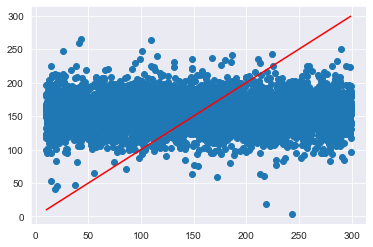



****************************************************************************************************





CatBoost Regressor


Training score : 0.1897


Test Score : -0.0301


K-fold accuracy : -0.0316


Standard Deviation of Accuracies in k-fold : 0.0080


Score : 91.3832




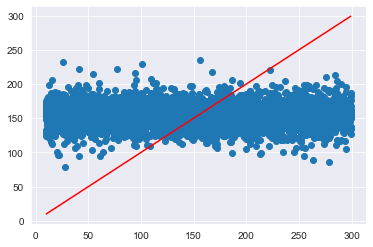



****************************************************************************************************





Light GBMRegressor


Training score : 0.1011


Test Score : -0.0132


K-fold accuracy : -0.0134


Standard Deviation of Accuracies in k-fold : 0.0042


Score : 91.4142




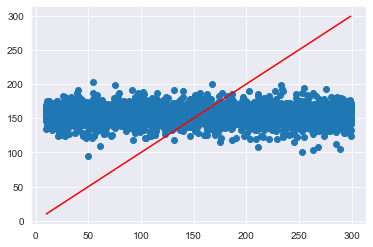



****************************************************************************************************





Gradient Boosting


Training score : 0.0198


Test Score : -0.0060


K-fold accuracy : -0.0051


Standard Deviation of Accuracies in k-fold : 0.0015


Score : 91.4231




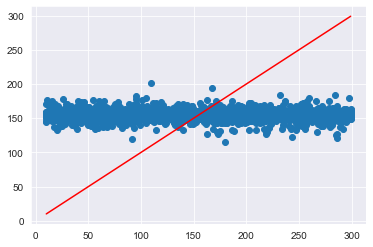



****************************************************************************************************





RandomForest Regressor


Training score : 0.8529


Test Score : -0.0568


K-fold accuracy : -0.0503


Standard Deviation of Accuracies in k-fold : 0.0061


Score : 91.3521




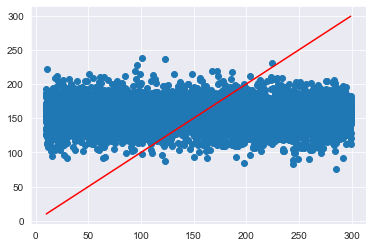



****************************************************************************************************





KNeigbors Regressor


Training score : 0.2013


Test Score : -0.2018


K-fold accuracy : -0.1921


Standard Deviation of Accuracies in k-fold : 0.0147


Score : 91.1580




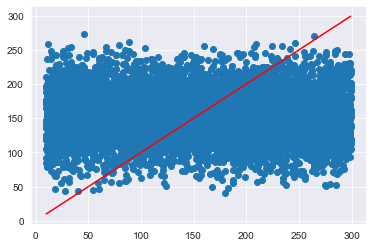



****************************************************************************************************



Wall time: 7min 15s


In [157]:
%%time

pre_final = []
for i in models:
    sam = metrics(i , X_train , y_train , X_test , y_test)
    pre_final.append(sam)

In [158]:
data_pre_final = [x[0] for x in pre_final]

## Model Evaluation and Visualization

In [159]:
me = pd.DataFrame(data_pre_final , columns = ["Model" , "Train Score" , "Test Score" , "K-fold Accuracy" , "K-fold Std" , "Score"])

me.sort_values(by = ["Score", "K-fold Accuracy" ,  "Train Score" , "Test Score"] , inplace = True , ascending = (False , False , False , False))
me = me.reset_index(drop = True)

me

,Model,Train Score,Test Score,K-fold Accuracy,K-fold Std,Score
0,Gradient Boosting,0.019810,-0.005972,-0.005131,0.001528,91.423135
1,Light GBMRegressor,0.101080,-0.013157,-0.013423,0.004162,91.414201
2,CatBoost Regressor,0.189671,-0.030135,-0.031601,0.008038,91.383207
3,RandomForest Regressor,0.852924,-0.056789,-0.050281,0.006107,91.352070
4,XGBRegressor,0.279016,-0.071509,-0.074948,0.011561,91.324424
5,KNeigbors Regressor,0.201256,-0.201781,-0.192076,0.014652,91.157976


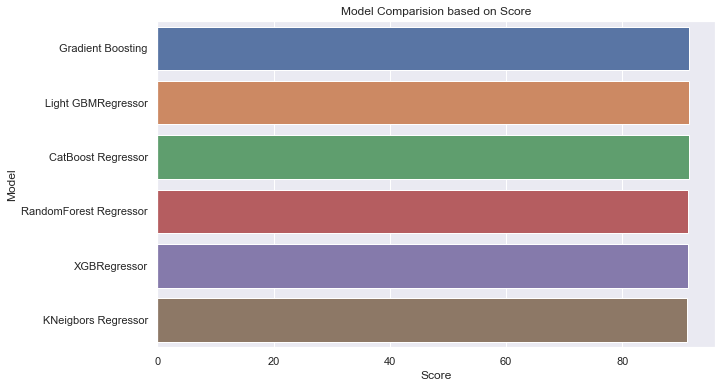

In [184]:
plt.figure(figsize = (10 , 6))
sns.barplot(y = "Model" , x = "Score" , data = me)
plt.title("Model Comparision based on Score");

In [185]:
from sklearn.model_selection import GridSearchCV

##  Model Evaluation with LightGBM

In [160]:
import lightgbm as lgb

train_data = lgb.Dataset(X_train , label = y_train)
test_data = lgb.Dataset(X_test , label = y_test)

param = {'objective': 'regression',
         'num_leaves': 20,
         'boosting': 'gbdt',  
         'metric': 'mae',
         'learning_rate': 0.2, 
         'num_iterations': 1000,
         'num_leaves': 80,
         'max_depth': 6,
         'min_data_in_leaf': 11,
         'bagging_fraction': 0.80,
         'bagging_freq': 1,
         'bagging_seed': 142,
         'feature_fraction': 0.80,
         'feature_fraction_seed': 2,
         'early_stopping_round': 200,
         'max_bin': 250
         }

lgbm = lgb.train(params = param , verbose_eval=100 , train_set = train_data , valid_sets=[test_data])

y_pred_lgbm = lgbm.predict(X_test)

print('Score' , 100 - np.sqrt(mean_absolute_error(y_test , y_pred_lgbm)))

[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002963 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1219
[LightGBM] [Info] Number of data points in the train set: 27000, number of used features: 23
[LightGBM] [Info] Start training from score 154.902852
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[L

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

In [161]:
def feature_importance_lgbm(model , X_train , y_train):
    features = model.feature_importance()
    temp = pd.DataFrame(list(zip(features , X_train.columns)) , columns = ["Feature Importances" , "Feartures"]).sort_values(by = ["Feature Importances"] , ascending = False).reset_index(drop = True)
    plt.figure(figsize = (15 , 15))
    sns.set(font_scale = 1)
    sns.barplot(data = temp , y = "Feartures" , x = "Feature Importances")
    plt.show()
    return temp

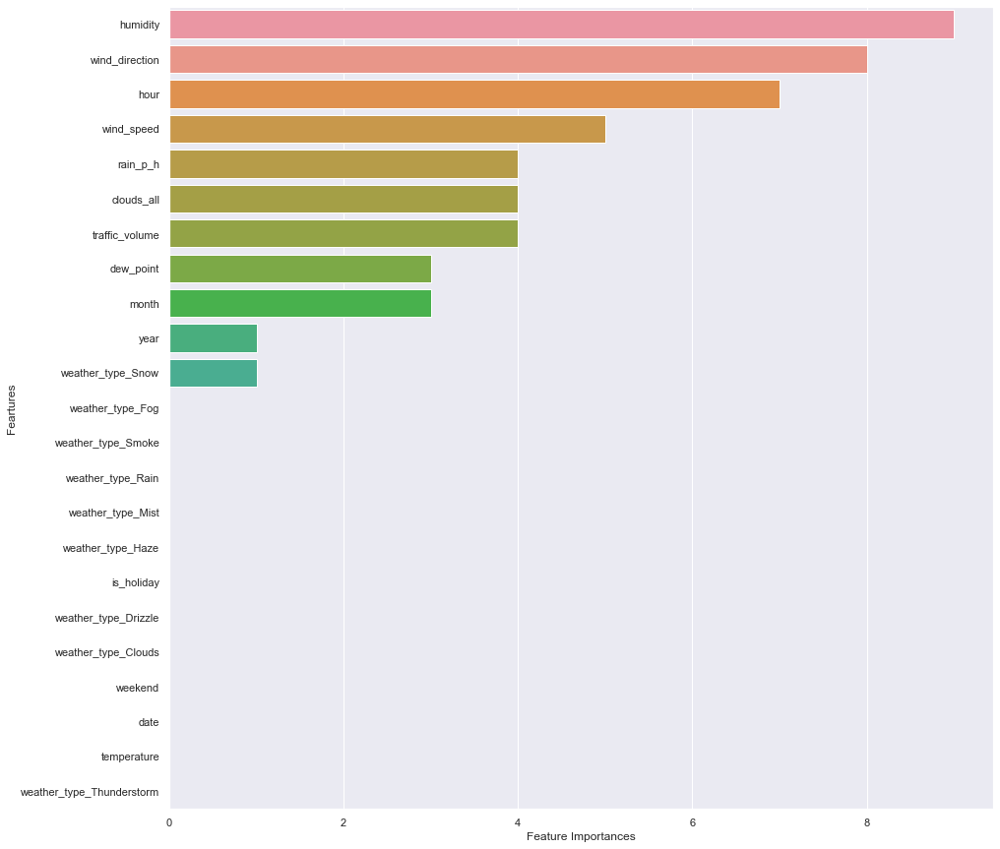

In [162]:
lgbm_df = feature_importance_lgbm(lgbm , X_train , y_train)

In [163]:
lgbm_df

,Feature Importances,Feartures
0,9,humidity
1,8,wind_direction
2,7,hour
3,5,wind_speed
4,4,rain_p_h
5,4,clouds_all
6,4,traffic_volume
7,3,dew_point
8,3,month
9,1,year


In [164]:
def Regression_plottings(model , X_test , y_test):
    plt.figure(figsize = (12 , 6))
    sns.scatterplot(x = y_test , y = model.predict(X_test))
    x = np.linspace(min(y_test) , max(y_test) , 100)
    y = x
    plt.plot(x, y , "-r")
    plt.show()
    
    print("\n\n")
    
    plt.figure(figsize = (12 , 6))
    sns.distplot(y_test - model.predict(X_test))
    plt.show()

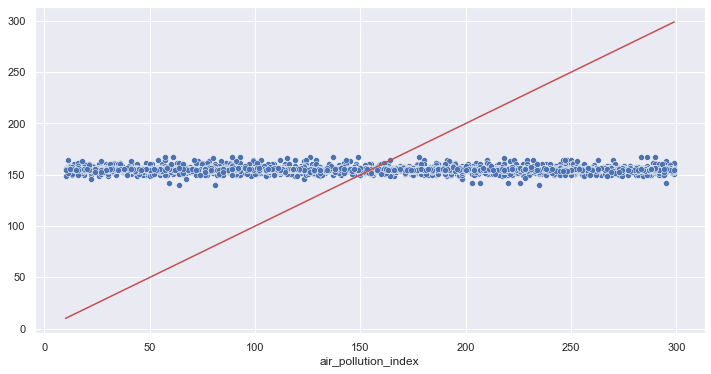

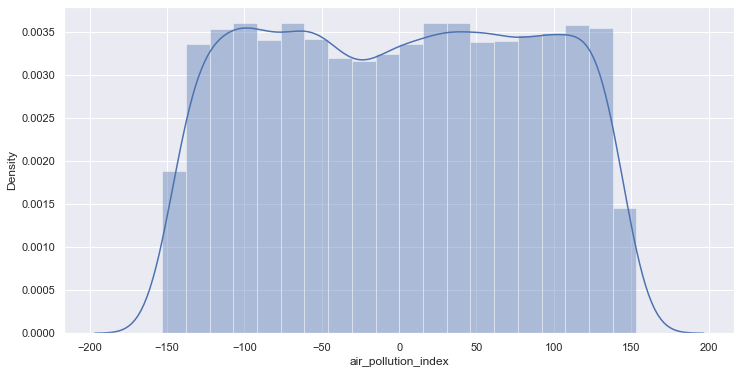

In [165]:
Regression_plottings(lgbm , X_test , y_test)

In [166]:
def feature_importance(model , X_train , y_train):
    features = model.feature_importances_
    temp = pd.DataFrame(list(zip(features , X_train.columns)) , columns = ["Feature Importances" , "Feartures"]).sort_values(by = ["Feature Importances"] , ascending = False).reset_index(drop = True)
    plt.figure(figsize = (15 , 15))
    sns.set(font_scale = 1)
    sns.barplot(data = temp , y = "Feartures" , x = "Feature Importances")
    plt.show()
    return temp

## Model Evaluation with Gradient Boosting

In [167]:
from sklearn.ensemble import GradientBoostingRegressor

gb = GradientBoostingRegressor(verbose = 1 , learning_rate = 0.001 , n_estimators = 10 , random_state = 42 , subsample = 0.8 , loss='ls')
gb.fit(X_train , y_train)
y_pred = gb.predict(X_test)

print("score" , 100 - np.sqrt(mean_absolute_error(y_test , y_pred)))

      Iter       Train Loss      OOB Improve   Remaining Time 
         1        7006.4966          -0.0053            2.98s
         2        6992.2927           0.0038            1.47s
         3        6984.6698          -0.0031            0.94s
         4        6943.9694          -0.0006            0.66s
         5        6965.3747          -0.0046            0.47s
         6        6978.4100          -0.0144            0.34s
         7        6952.3402           0.0192            0.23s
         8        6973.1590           0.0078            0.14s
         9        6992.6709           0.0017            0.07s
        10        6978.5859          -0.0036            0.00s
score 91.43584451018144


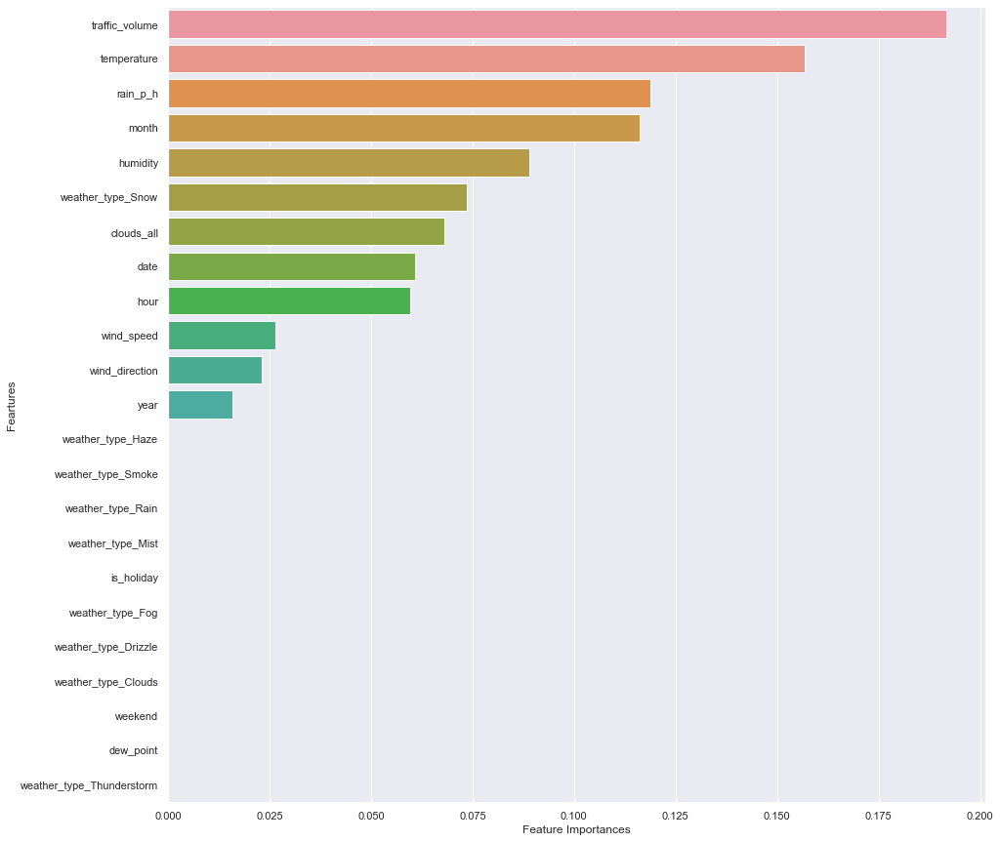

In [168]:
gb_df = feature_importance(gb , X_train , y_train)

In [169]:
gb_df

,Feature Importances,Feartures
0,0.191697,traffic_volume
1,0.156798,temperature
2,0.118689,rain_p_h
3,0.116091,month
4,0.089079,humidity
5,0.073554,weather_type_Snow
6,0.067972,clouds_all
7,0.060838,date
8,0.059759,hour
9,0.026394,wind_speed


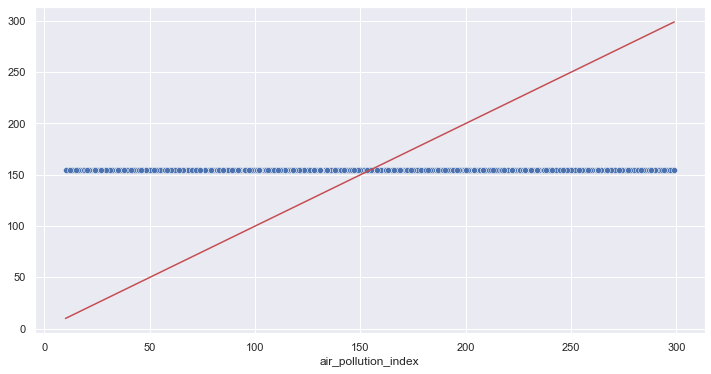

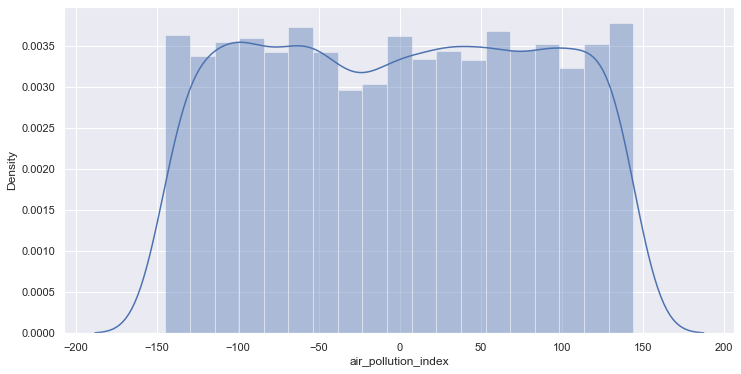

In [170]:
Regression_plottings(gb , X_test , y_test)

## Model Evaluation with Cat Boost

In [171]:
cat = CatBoostRegressor(random_state = 42 , verbose = 0)
cat.fit(X_train , y_train)

In [172]:
print("Cat_score" , 100 - np.sqrt(mean_absolute_error(y_test , cat.predict(X_test))))

Cat_score 91.38320663616526


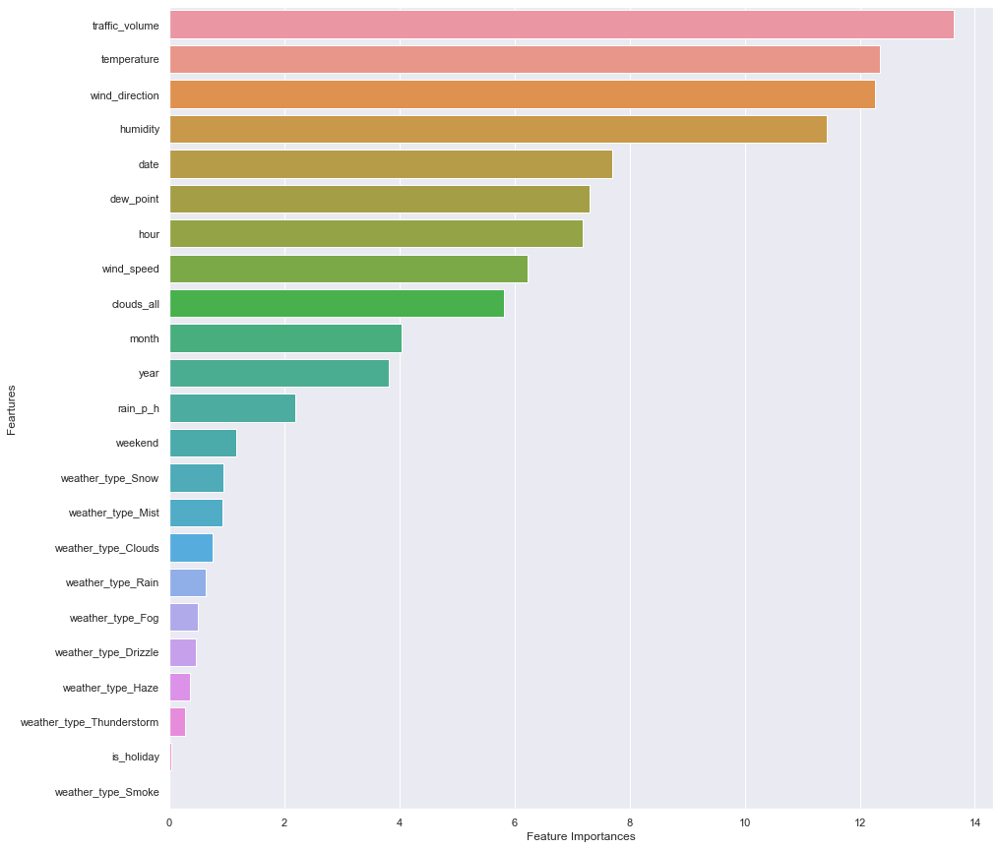

In [173]:
cat_df = feature_importance(cat , X_train , y_train)

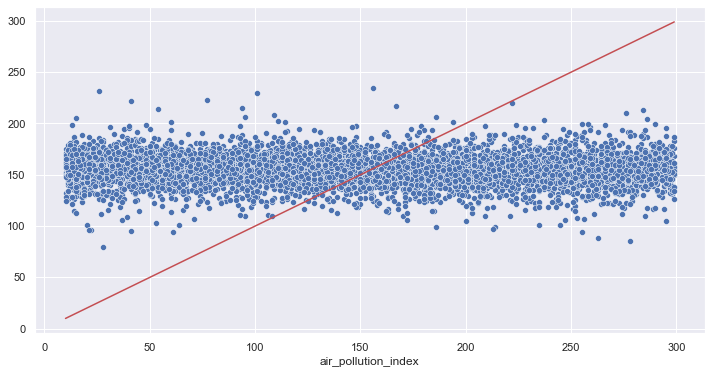

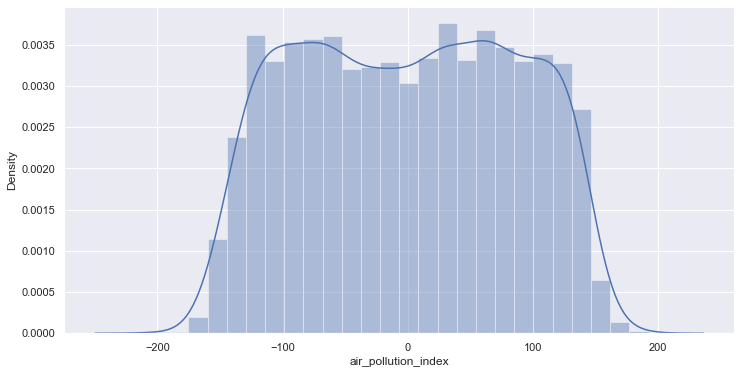

In [174]:
Regression_plottings(cat , X_test , y_test)

##  Model Evaluation with XG Boost

In [175]:
xgb = pre_final[0][1]

In [176]:
print("Xgb_score" , 100 - np.sqrt(mean_absolute_error(y_test , xgb.predict(X_test))))

Xgb_score 91.3244243970441


## Finalizing the Model

In [177]:
final_models = [lgbm , gb , cat , xgb]
model_scores = []

for i in final_models:
    model_scores.append(100 - np.sqrt(mean_absolute_error(y_test , i.predict(X_test))))

In [178]:
model_scores

[91.43334426032038, 91.43584451018144, 91.38320663616526, 91.3244243970441]

In [179]:
final_df = pd.DataFrame({"Model" : ["LightGBM" , "GradientBoosting" , "CatBoost" , "XGB"] , 
              "Scores" : model_scores}).sort_values(by = "Scores" , ascending = False)

final_df

,Model,Scores
1,GradientBoosting,91.435845
0,LightGBM,91.433344
2,CatBoost,91.383207
3,XGB,91.324424


## Fitting the best model (Gradinet Boosting Model)

In [180]:
data_gb = {"date_time" : ids ,
            "air_pollution_index" : gb.predict(tt)}

In [181]:
final_gb = pd.DataFrame(data_gb)
final_gb

,date_time,air_pollution_index
0,2017-05-18 00:00:00,154.930751
1,2017-05-18 00:00:00,154.930751
2,2017-05-18 00:00:00,154.930751
3,2017-05-18 01:00:00,154.906940
4,2017-05-18 01:00:00,154.906940
...,...,...
14449,2018-09-30 19:00:00,154.907837
14450,2018-09-30 20:00:00,154.913824
14451,2018-09-30 21:00:00,154.907164
14452,2018-09-30 22:00:00,154.894600


In [183]:
final_gb.to_csv("Submission_gb_1.csv" , index = False)